In [1]:
import sys
import numpy as np
import matplotlib.pyplot as plt

sys.path.append('..')
from extinctions import *
from preprocessing import *
from plotting_parameters import *

In [2]:
bands_range = [520,900]
band_centers = np.arange(bands_range[0], bands_range[1]+1)
endmember_labels = ["oxCytc", "redCytc", "oxCytb", "redCytb", "oxCCO", "redCCO", "HHb", "HbO$_2$", "water", "lipids", "a'"]

extinction_dict = get_extinctions(bands_range)
cyt_c_ox = extinction_dict["cyt_c_ox"]
cyt_c_red = extinction_dict["cyt_c_red"]
cyt_b_ox = extinction_dict["cyt_b_ox"]
cyt_b_red = extinction_dict["cyt_b_red"]
cyt_oxi_ox = extinction_dict["cyt_oxi_ox"]
cyt_oxi_red = extinction_dict["cyt_oxi_red"]
hb = extinction_dict["hb"]
hbo2 = extinction_dict["hbo2"]
water = extinction_dict["water"]
fat = extinction_dict["fat"]
scatter_simple = (band_centers/500)**(-1.2)


M_scatter_orig = np.vstack((cyt_c_ox, cyt_c_red, cyt_b_ox, cyt_b_red, cyt_oxi_ox, cyt_oxi_red, hb, hbo2, water, fat, scatter_simple)).T
M_scatter_orig_smooth = smooth_spectral(M_scatter_orig.T,5).T

In [3]:
spectra_folder = "./spectra_mc/"

hb_mc = np.loadtxt(spectra_folder + "m_hhb_50.txt")
hbo2_mc = np.loadtxt(spectra_folder + "m_hbo2_50.txt")
cyt_c_ox_mc = np.loadtxt(spectra_folder + "m_cyt_c_ox_20.txt")
cyt_c_red_mc = np.loadtxt(spectra_folder + "m_cyt_c_red_20.txt")
cyt_b_ox_mc = np.loadtxt(spectra_folder + "m_cyt_b_ox_20.txt")
cyt_b_red_mc = np.loadtxt(spectra_folder + "m_cyt_b_red_20.txt")
cyt_oxi_ox_mc = np.loadtxt(spectra_folder + "m_cyt_oxi_ox_20.txt")
cyt_oxi_red_mc = np.loadtxt(spectra_folder + "m_cyt_oxi_red_20.txt")
scatter_mc = np.loadtxt(spectra_folder + "m_scatter_40.txt")
water_mc = np.loadtxt(spectra_folder + "m_water_200.txt")
fat_mc = np.loadtxt(spectra_folder + "m_fat_200.txt")

M_mc = np.vstack((cyt_c_ox_mc, cyt_c_red_mc, cyt_b_ox_mc, cyt_b_red_mc, cyt_oxi_ox_mc, cyt_oxi_red_mc, hb_mc, hbo2_mc, water_mc, fat_mc, scatter_mc)).T
M_mc_smooth = smooth_spectral(M_mc.T,5).T

M_hb = np.vstack((cyt_c_ox, cyt_c_red, cyt_b_ox, cyt_b_red, cyt_oxi_ox, cyt_oxi_red, hb_mc, hbo2_mc, water, fat, scatter_simple)).T
M_hb = smooth_spectral(M_hb.T,5).T

In [4]:
data_folder = "../../datasets/helicoid/012-01"
# data_folder = "../../datasets/helicoid/008-01"

class_labels = ["Not labled", "Normal", "Tumor", "Hypervascularized", "Background"]
# class_colors = ["white", tum_blue_dark_2, tum_orange, tum_red, tum_grey_5]

# Load the sp data
img = sp.open_image(data_folder + "/raw.hdr")
white_ref = sp.open_image(data_folder + "/whiteReference.hdr")
dark_ref = sp.open_image(data_folder + "/darkReference.hdr")
gt_map = sp.open_image(data_folder + "/gtMap.hdr")
# plot_img(img, gt_map, class_labels, class_colors, figsize=(5,5), legend=True)

# preprocessing
img_interp, band_centers = bands_lin_interpolation(img, img.bands.centers, bands_range)
white_ref_interp, _ = bands_lin_interpolation(white_ref, img.bands.centers, bands_range)
dark_ref_interp, _ = bands_lin_interpolation(dark_ref, img.bands.centers, bands_range)
img_calib = calibrate_img(img_interp, white_ref_interp, dark_ref_interp)
img_calib_norm = img_calib / np.linalg.norm(img_calib, axis=2, ord=1, keepdims=True)
img_smooth = smooth_spectral(img_calib_norm, 5)
absorbance = -np.log(img_smooth - np.min(img_smooth.flatten()) + 1e-8)

# select random spectrum from normal class
np.random.seed(1)
normal_idx = np.argwhere(gt_map.asarray() == 1)
random_idx = np.random.choice(normal_idx.shape[0])
reference_spectrum = absorbance[normal_idx[random_idx,0], normal_idx[random_idx,1], :]

# calculate absorbance difference between the selected spectrum and the rest of the image
delta_absorbance = absorbance - reference_spectrum[None,None,:]

/home/martin_ivan/anaconda3/envs/thesis/lib/python3.10/site-packages/spectral/io/envi.py:175: UserWarning: Parameters with non-lowercase names encountered and converted to lowercase. To retain source file parameter name capitalization, set spectral.settings.envi_support_nonlowercase_params to True.
  warnings.warn(msg)


(<Figure size 500x400 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

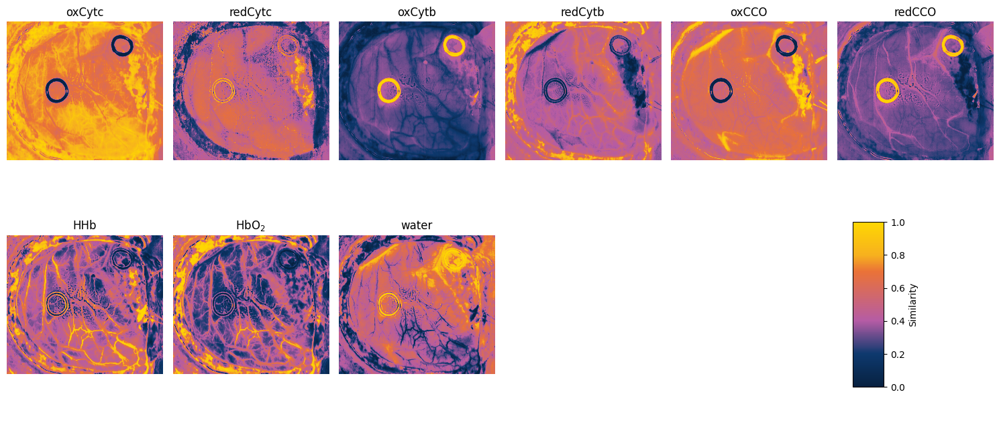

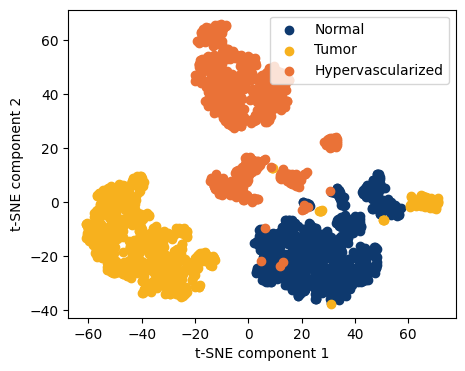

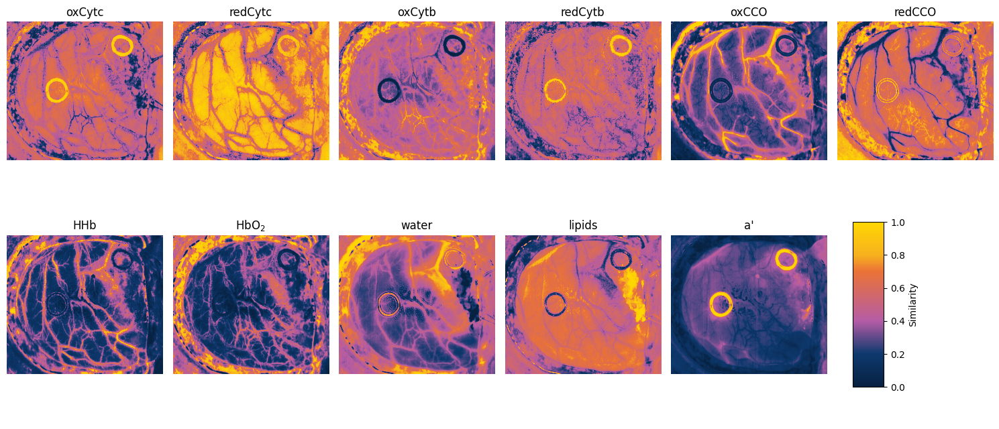

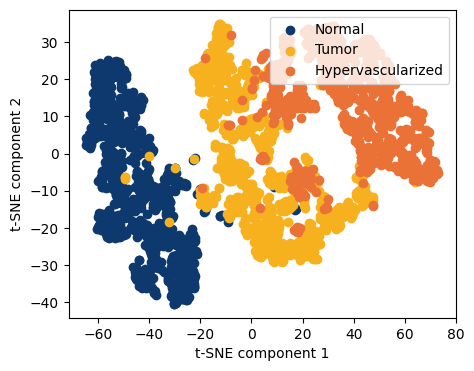

In [48]:
n = M_mc.shape[1]
l,m = absorbance.shape[:2]
heatmaps = np.zeros((l,m,n))
for i in range(n):
    endmembers_remove = np.delete(M_mc_smooth, i, axis=1).T
    endmember_target = M_mc_smooth[:,i]
    heatmaps[:,:,i] = osp(delta_absorbance, endmembers_remove, endmember_target)

plot_concentrations(clip_data(heatmaps), endmember_labels, figsize=(15,7));
plot_tsne(clip_data(heatmaps), gt_map, class_labels, figsize=(5,4))

n = M_scatter_orig_smooth.shape[1]
l,m = absorbance.shape[:2]
heatmaps = np.zeros((l,m,n))
for i in range(n):
    endmembers_remove = np.delete(M_scatter_orig_smooth, i, axis=1).T
    endmember_target = M_scatter_orig_smooth[:,i]
    heatmaps[:,:,i] = osp(delta_absorbance, endmembers_remove, endmember_target)

plot_concentrations(clip_data(heatmaps), endmember_labels, figsize=(15,7));
plot_tsne(clip_data(heatmaps), gt_map, class_labels, figsize=(5,4))


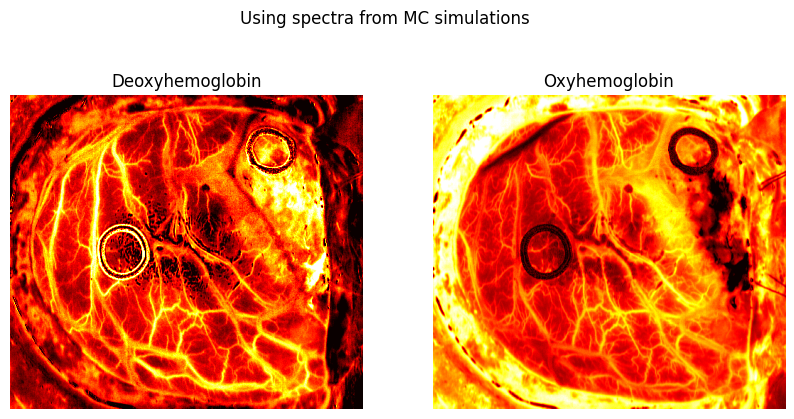

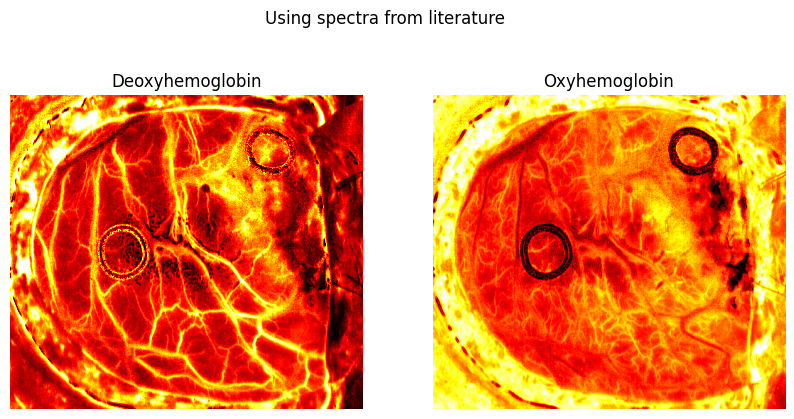

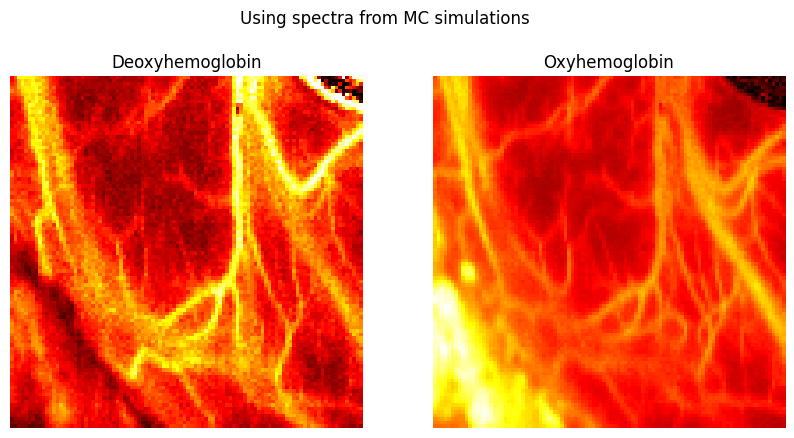

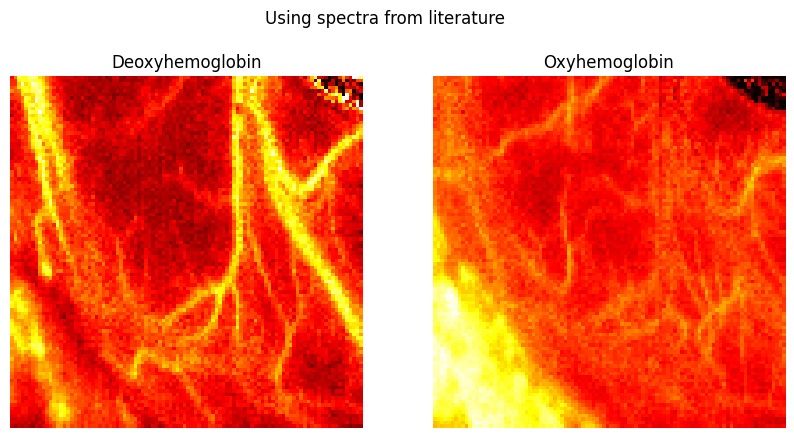

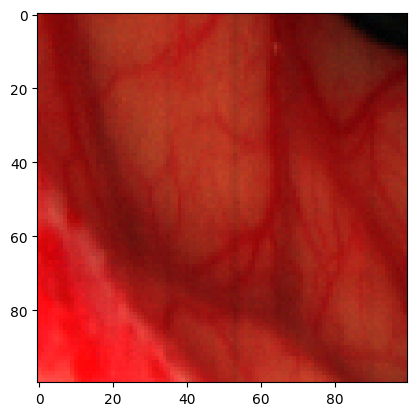

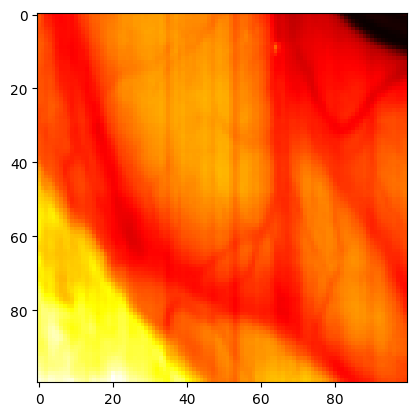

In [6]:
# OSP using spectra from MC simulations
M_scatter_new = np.vstack((cyt_c_ox, cyt_c_red, cyt_b_ox, cyt_b_red, cyt_oxi_ox, cyt_oxi_red, hb_mc, hbo2_mc, water, fat, scatter_simple)).T
M_scatter_new_smooth = smooth_spectral(M_scatter_new.T,5).T

endmembers_remove = np.delete(M_scatter_new_smooth, 6, axis=1).T
data_hb_mc = osp(delta_absorbance, endmembers_remove, hb_mc)
endmembers_remove = np.delete(M_scatter_new_smooth, 7, axis=1).T
data_hbo2_mc = osp(delta_absorbance, endmembers_remove, hbo2_mc)


# OSP using spectra from literature
M_scatter_orig = np.vstack((cyt_c_ox, cyt_c_red, cyt_b_ox, cyt_b_red, cyt_oxi_ox, cyt_oxi_red, hb, hbo2, water, fat, scatter_simple)).T
M_scatter_orig_smooth = smooth_spectral(M_scatter_orig.T,5).T

endmembers_remove = np.delete(M_scatter_orig_smooth, 6, axis=1).T
data_hb = osp(delta_absorbance, endmembers_remove, hb)
endmembers_remove = np.delete(M_scatter_orig_smooth, 7, axis=1).T
data_hbo2 = osp(delta_absorbance, endmembers_remove, hbo2)

fig, axs = plt.subplots(1,2,figsize=(10,5))
fig.suptitle("Using spectra from MC simulations")
axs[0].imshow(clip_data(data_hb_mc,6,99), cmap="hot")
axs[0].set_title("Deoxyhemoglobin")
axs[0].set_axis_off()
axs[1].imshow(clip_data(data_hbo2_mc), cmap="hot")
axs[1].set_title("Oxyhemoglobin")
axs[1].set_axis_off()

fig, axs = plt.subplots(1,2,figsize=(10,5))
fig.suptitle("Using spectra from literature")
axs[0].imshow(clip_data(data_hb), cmap="hot")
axs[0].set_title("Deoxyhemoglobin")
axs[0].set_axis_off()
axs[1].imshow(clip_data(data_hbo2), cmap="hot")
axs[1].set_title("Oxyhemoglobin")
axs[1].set_axis_off()


fig, axs = plt.subplots(1,2,figsize=(10,5))
fig.suptitle("Using spectra from MC simulations")
axs[0].imshow(clip_data(data_hb_mc,6,99)[250:350,50:150], cmap="hot")
axs[0].set_title("Deoxyhemoglobin")
axs[0].set_axis_off()
axs[1].imshow(clip_data(data_hbo2_mc)[250:350,50:150], cmap="hot")
axs[1].set_title("Oxyhemoglobin")
axs[1].set_axis_off()

fig, axs = plt.subplots(1,2,figsize=(10,5))
fig.suptitle("Using spectra from literature")
axs[0].imshow(clip_data(data_hb)[250:350,50:150], cmap="hot")
axs[0].set_title("Deoxyhemoglobin")
axs[0].set_axis_off()
axs[1].imshow(clip_data(data_hbo2)[250:350,50:150], cmap="hot")
axs[1].set_title("Oxyhemoglobin")
axs[1].set_axis_off()

plt.figure()
plt.imshow(get_rgb(img[250:350,50:150,:]))
plt.figure()
plt.imshow(np.linalg.norm(img[250:350,50:150,:], axis=2), cmap="hot")

(<Figure size 500x400 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

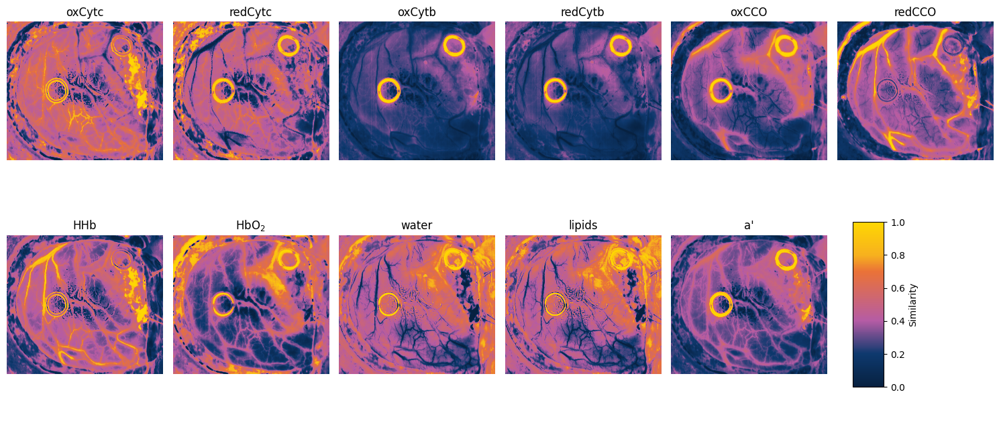

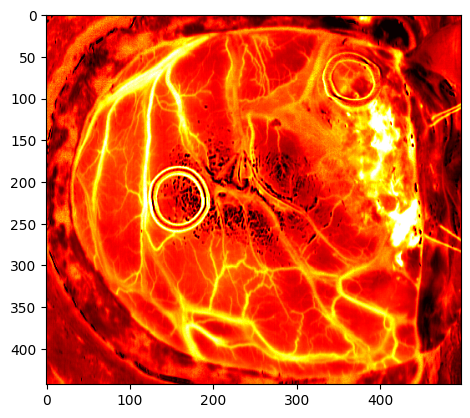

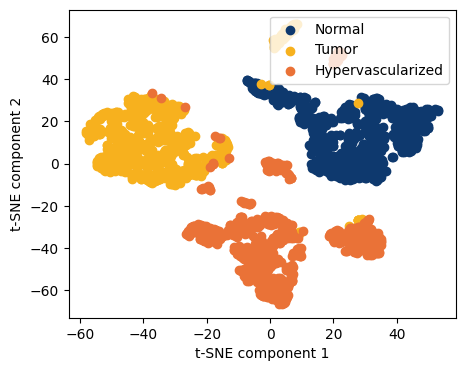

In [26]:
n = M_mc.shape[1]
l,m = absorbance.shape[:2]
heatmaps = np.zeros((l,m,n))
for i in range(n):
    endmember_target = M_mc_smooth[:,i]
    heatmaps[:,:,i] = icem(delta_absorbance, endmember_target, 1)

plot_concentrations(clip_data(heatmaps), endmember_labels, figsize=(15,7))
plt.figure()
plt.imshow(clip_data(heatmaps[:,:,6]), cmap='hot')

plot_tsne(clip_data(heatmaps), gt_map, class_labels, figsize=(5,4))

In [41]:
def sicem(spectr, endmembers, lmda=0):
    '''
    Sum Improved constrained energy minimization (ICEM) algorithm.
    input:
        spectr: image to unmix, shape (...,k) where k is the number of bands and ... are the spatial or time dimensions
        endmember: endmember extract, shape (k,n) where n is the number of endmembers
        lmda: regularization parameter, float
    output:
        heatmap, np.array
    '''
    input_shape = spectr.shape
    k, n = endmembers.shape
    M = spectr.reshape(-1, input_shape[-1])
    N, p = M.shape

    def corr(M):
            p, N = M.shape
            return np.dot(M, M.T) / N
    
    R_hat = corr(M.T) + lmda * np.eye(p)
    Rinv = scipy.linalg.inv(R_hat)

    map = np.zeros((input_shape[0], input_shape[1], n))
    for i in range(n):
        t = endmembers[:,i]
        denom = np.dot(t.T, np.dot(Rinv, t))
        t_Rinv = np.dot(t.T, Rinv)
        y = np.dot(t_Rinv , M[0:,:].T) / denom
        map[:,:,i] = y.reshape(input_shape[:-1])

    return np.sum(map, axis=2)

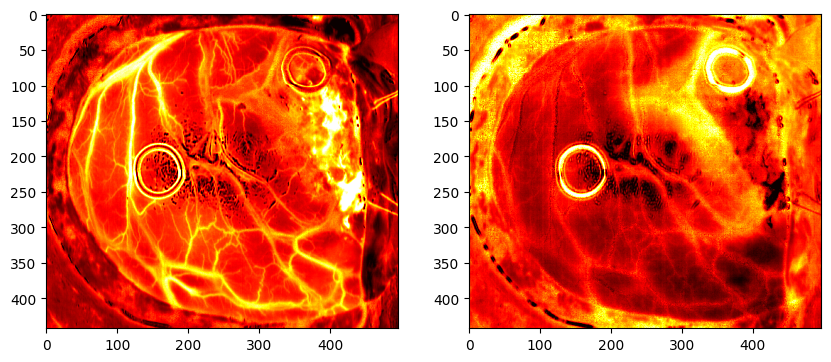

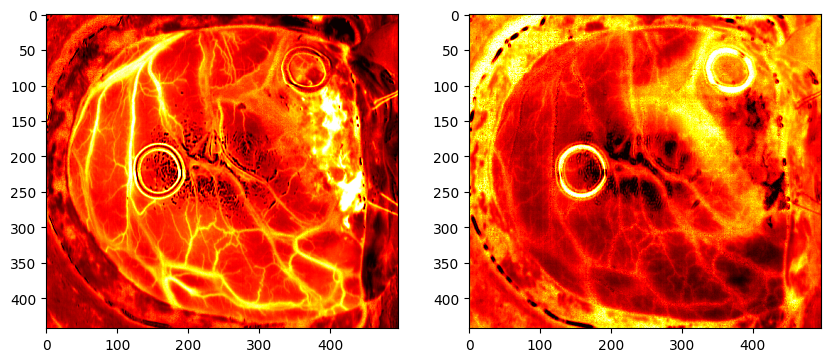

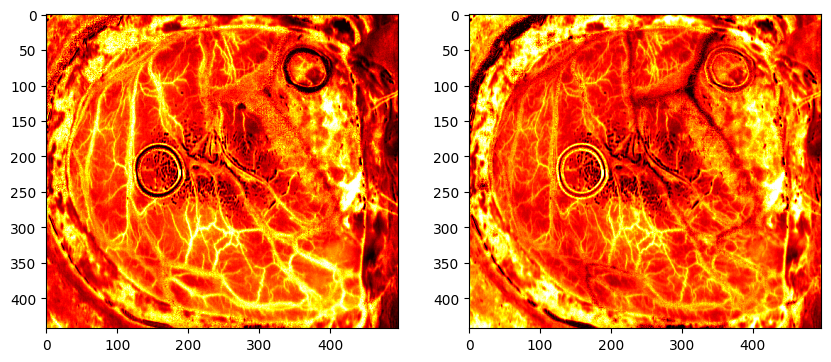

In [42]:
hb_mc_1 = np.loadtxt(spectra_folder + "m_hhb_50.txt")
hb_mc_2 = np.loadtxt(spectra_folder + "m_hhb_50_2.txt")
hb_mc_3 = np.loadtxt(spectra_folder + "m_hhb_50_3.txt")
hb_mc_combined = np.vstack((hb_mc_1, hb_mc_2, hb_mc_3)).T
# # plot the spectra
# plt.figure()
# plt.plot(band_centers, hb_mc_1, label="hb_mc_1")
# plt.plot(band_centers, hb_mc_2, label="hb_mc_2")
# plt.plot(band_centers, hb_mc_3, label="hb_mc_3")


hbo2_mc_1 = np.loadtxt(spectra_folder + "m_hbo2_50.txt")
hbo2_mc_2 = np.loadtxt(spectra_folder + "m_hbo2_50_2.txt")
hbo2_mc_3 = np.loadtxt(spectra_folder + "m_hbo2_50_3.txt")
hbo2_mc_combined = np.vstack((hbo2_mc_1, hbo2_mc_2, hbo2_mc_3)).T
# # plot the spectra
# plt.figure()
# plt.plot(band_centers, hbo2_mc_1, label="hbo2_mc_1")
# plt.plot(band_centers, hbo2_mc_2, label="hbo2_mc_2")
# plt.plot(band_centers, hbo2_mc_3, label="hbo2_mc_3")

# plt.figure()
# plt.plot(hbo2)

lmda = 0.5

heatmap_hb = sicem(delta_absorbance, hb_mc_combined, lmda)
heatmap_hbo2 = sicem(delta_absorbance, hbo2_mc_combined, lmda)
fig, axs = plt.subplots(1,2,figsize=(10,5))
axs[0].imshow(clip_data(heatmap_hb), cmap="hot")
axs[1].imshow(clip_data(heatmap_hbo2), cmap="hot")

heatmap_hb = icem(delta_absorbance, hb_mc, lmda)
heatmap_hbo2 = icem(delta_absorbance, hbo2_mc, lmda)
fig, axs = plt.subplots(1,2,figsize=(10,5))
axs[0].imshow(clip_data(heatmap_hb), cmap="hot")
axs[1].imshow(clip_data(heatmap_hbo2), cmap="hot")

heatmap_hb = icem(delta_absorbance, hb, lmda)
heatmap_hbo2 = icem(delta_absorbance, hbo2, lmda)
fig, axs = plt.subplots(1,2,figsize=(10,5))
axs[0].imshow(clip_data(heatmap_hb), cmap="hot")
axs[1].imshow(clip_data(heatmap_hbo2), cmap="hot")

In [3]:
class_labels = ["Not labled", "Normal", "Tumor", "Hypervascularized", "Background"]
bands_range = [520,900]
band_centers = np.arange(bands_range[0], bands_range[1]+1)
gradeIVpatients = ["008-01", "008-02", "010-03", "012-01", "012-02", "015-01", "016-04", "016-05", "017-01", "020-01"]

abs_data = None
raw_data = None
preprocessed_data = None
for patient in gradeIVpatients:
    data_folder = f"../../datasets/helicoid/{patient}"

    # Load the sp data
    img = sp.open_image(data_folder + "/raw.hdr")
    white_ref = sp.open_image(data_folder + "/whiteReference.hdr")
    dark_ref = sp.open_image(data_folder + "/darkReference.hdr")
    gt_map = sp.open_image(data_folder + "/gtMap.hdr")

    # preprocessing
    img_interp, band_centers = bands_lin_interpolation(img, img.bands.centers, bands_range)
    white_ref_interp, _ = bands_lin_interpolation(white_ref, img.bands.centers, bands_range)
    dark_ref_interp, _ = bands_lin_interpolation(dark_ref, img.bands.centers, bands_range)
    img_calib = calibrate_img(img_interp, white_ref_interp, dark_ref_interp)
    img_calib_norm = img_calib / np.linalg.norm(img_calib, axis=(0,1), ord=1, keepdims=True)
    img_smooth = smooth_spectral(img_calib_norm, 5)
    absorbance = -np.log(img_smooth - np.min(img_smooth.flatten()) + 1e-8)

    # select random spectrum from normal class
    np.random.seed(1)
    normal_idx = np.argwhere(gt_map.asarray() == 1)
    random_idx = np.random.choice(normal_idx.shape[0])
    reference_spectrum = absorbance[normal_idx[random_idx,0], normal_idx[random_idx,1], :]

    # calculate absorbance difference between the selected spectrum and the rest of the image
    delta_absorbance = absorbance - reference_spectrum[None,None,:]

    k = delta_absorbance.shape[-1]
    raw_flat = img_interp.reshape(-1, k)
    preprocessed_flat = img_smooth.reshape(-1, k)
    abs_flat = delta_absorbance.reshape(-1, k)
    gt_flat = gt_map.asarray().squeeze().flatten()

    if abs_data is None:
        raw_data = raw_flat[(gt_flat != 0) & (gt_flat != 4)]
        preprocessed_data = preprocessed_flat[(gt_flat != 0) & (gt_flat != 4)]
        abs_data = abs_flat[(gt_flat != 0) & (gt_flat != 4)]
        gt_data = gt_flat[(gt_flat != 0) & (gt_flat != 4)]
    else:
        raw_data = np.append(raw_data, raw_flat[(gt_flat != 0) & (gt_flat != 4)], axis=0)
        preprocessed_data = np.append(preprocessed_data, preprocessed_flat[(gt_flat != 0) & (gt_flat != 4)], axis=0)
        abs_data = np.append(abs_data, abs_flat[(gt_flat != 0) & (gt_flat != 4)], axis=0)
        gt_data = np.append(gt_data, gt_flat[(gt_flat != 0) & (gt_flat != 4)], axis=0)

    print(abs_data.shape)
    print(gt_data.shape)

/home/martin_ivan/anaconda3/envs/thesis/lib/python3.10/site-packages/spectral/io/envi.py:175: UserWarning: Parameters with non-lowercase names encountered and converted to lowercase. To retain source file parameter name capitalization, set spectral.settings.envi_support_nonlowercase_params to True.
  warnings.warn(msg)


(4847, 381)
(4847,)
(8172, 381)
(8172,)
(21130, 381)
(21130,)
(35198, 381)
(35198,)
(50931, 381)
(50931,)
(58317, 381)
(58317,)
(60559, 381)
(60559,)
(63654, 381)
(63654,)
(65050, 381)
(65050,)
(72060, 381)
(72060,)


In [15]:
# np.save("raw_data.npy", raw_data)
# np.save("preprocessed_data.npy", preprocessed_data)
# np.save("diff_abs_data.npy", abs_data)
# np.save("gt_data.npy", gt_data)

# load the data
raw_data = np.load("raw_data.npy")
preprocessed_data = np.load("preprocessed_data.npy")
gt_data = np.load("gt_data.npy")
abs_data = np.load("diff_abs_data.npy")

T-SNE of raw image data

(<Figure size 1500x1500 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

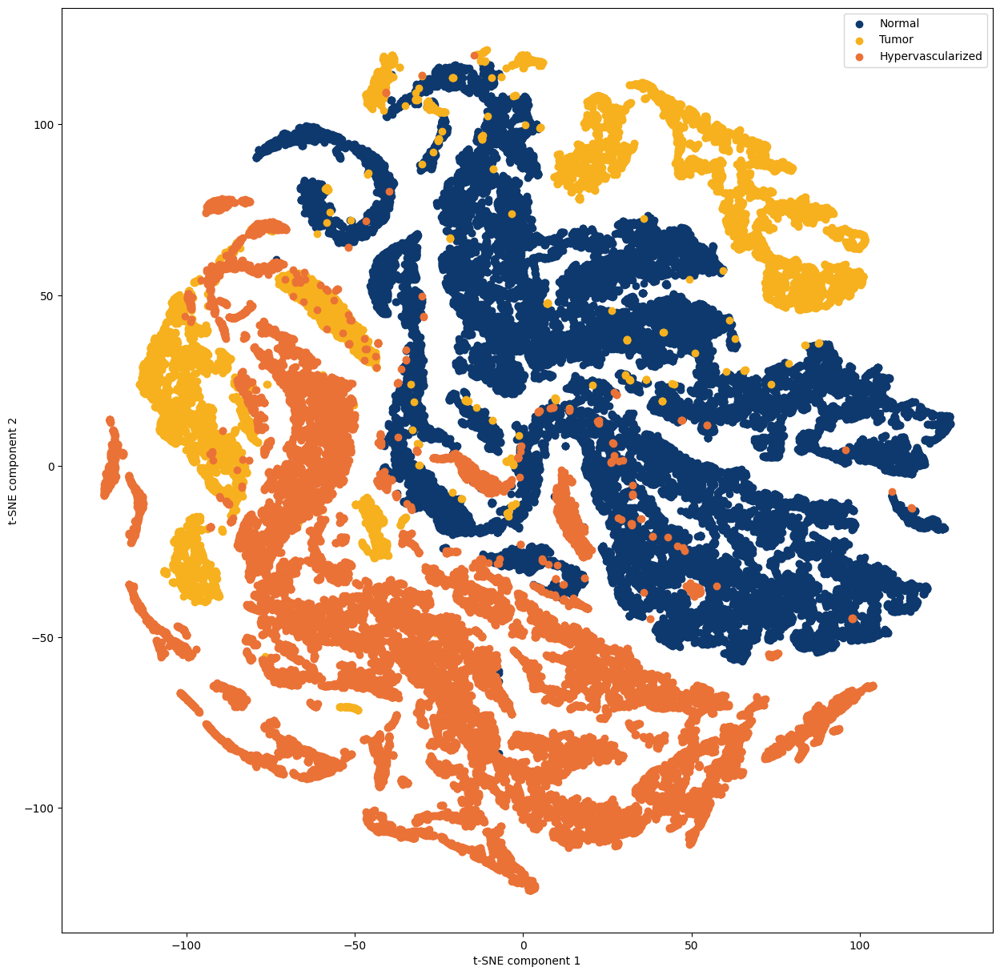

In [12]:
plot_tsne(raw_data, gt_data, class_labels, figsize=(15,15), mode="all")

T-SNE of preprocessed image data

(<Figure size 1500x1500 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

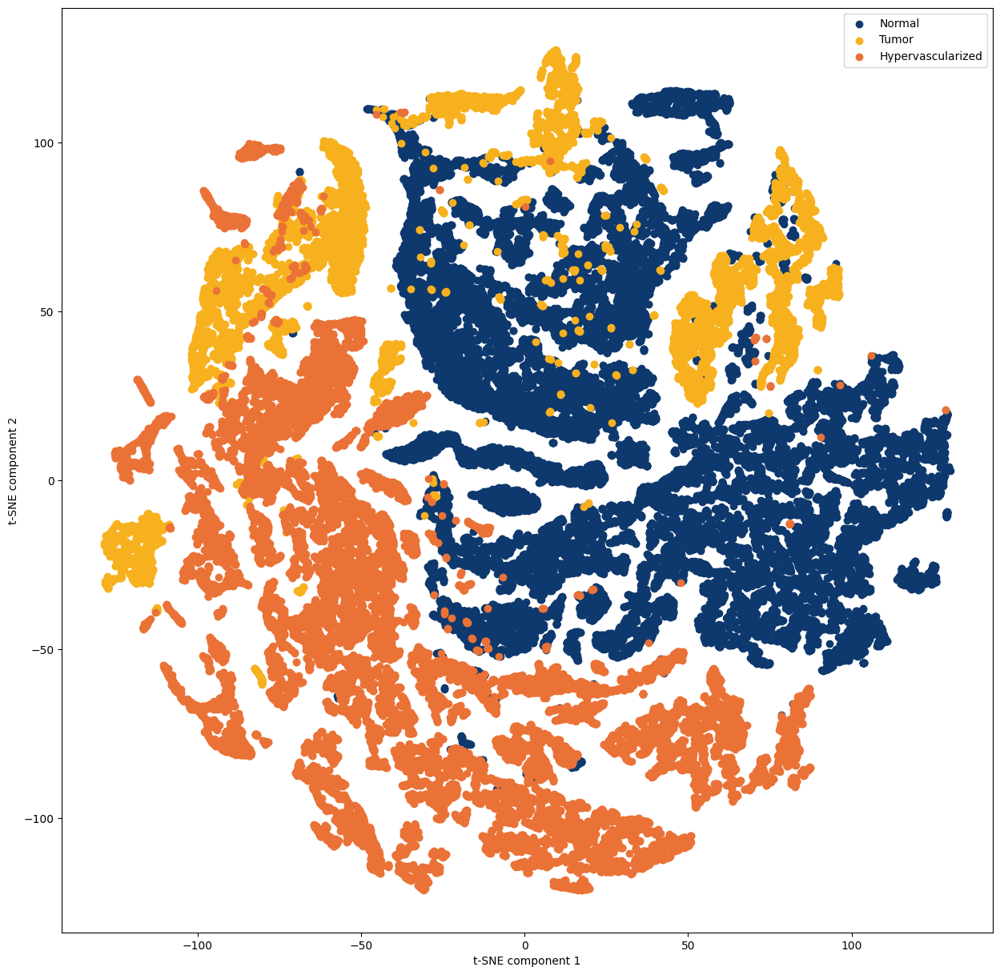

In [13]:
plot_tsne(preprocessed_data, gt_data, class_labels, figsize=(15,15), mode="all")

T-SNE of difference w.r.t. normal reference pixel (preprocessed)

(<Figure size 1500x1500 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

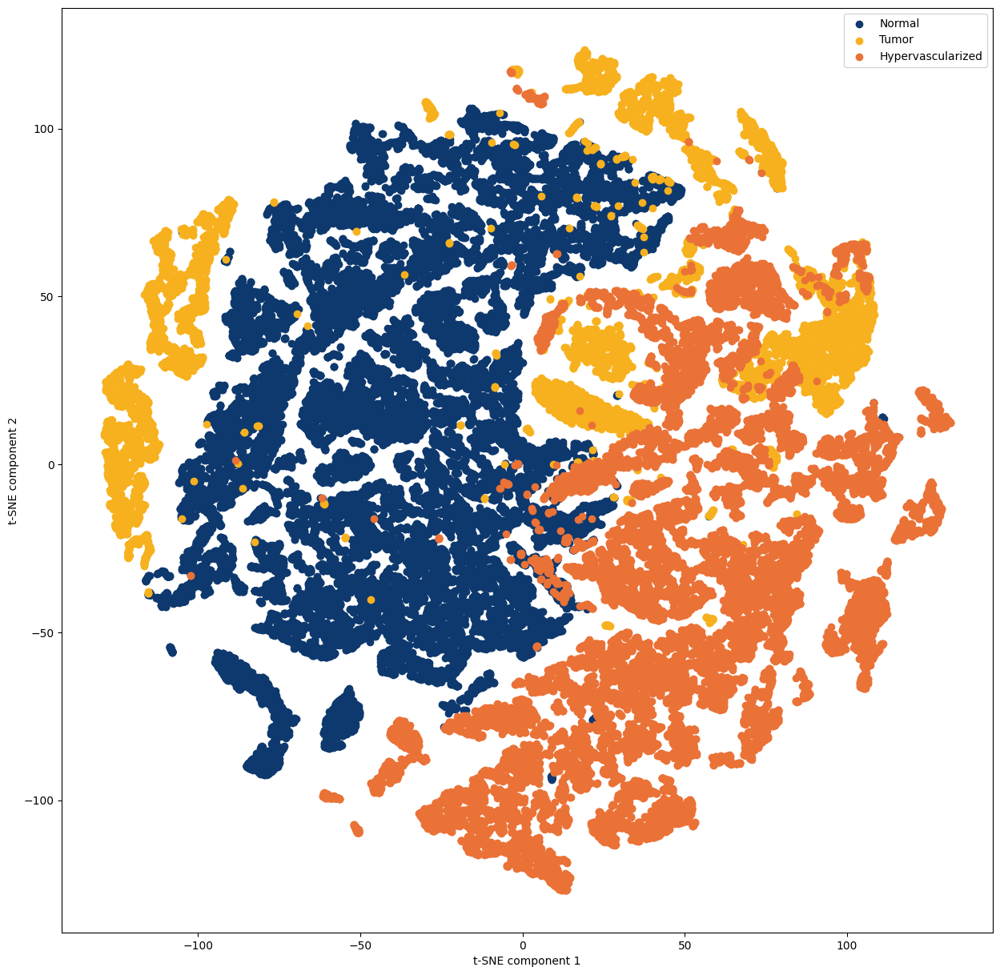

In [29]:
plot_tsne(abs_data, gt_data, class_labels, figsize=(15,15), mode="all")

T-SNE of OSP with original spectra

(<Figure size 1500x1500 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

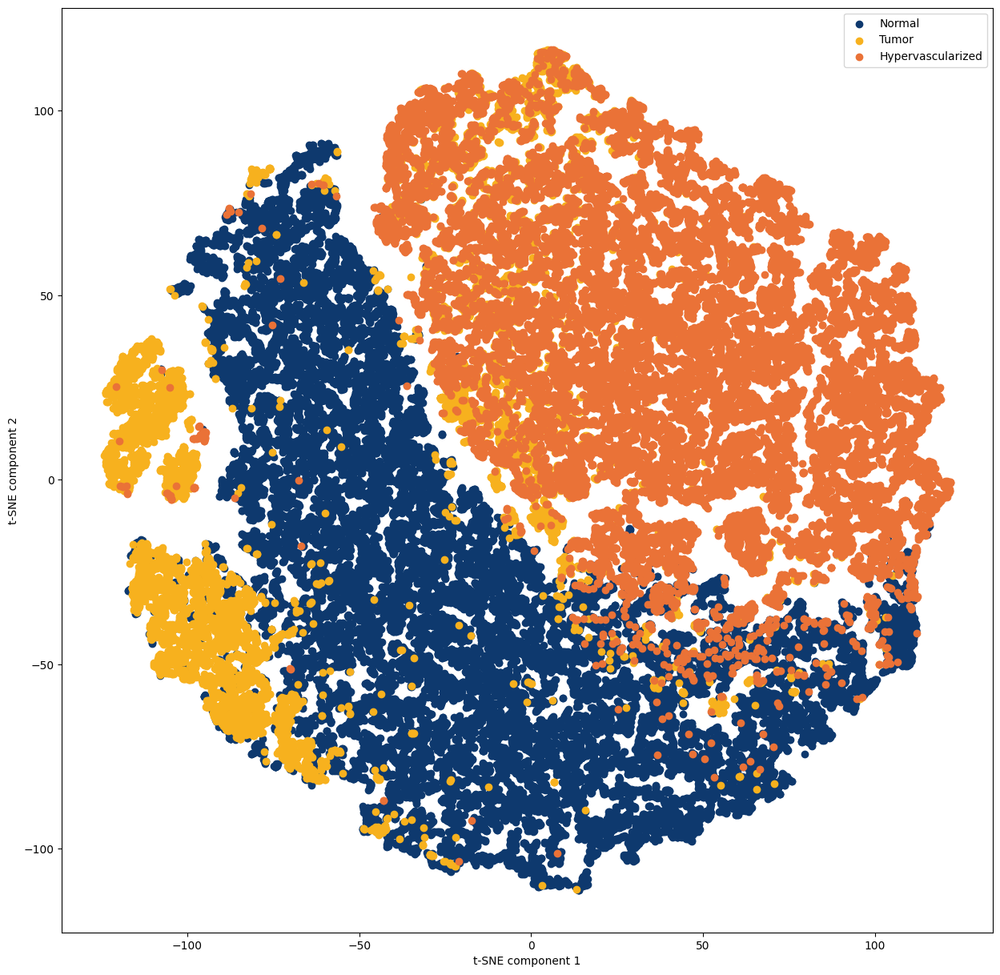

In [31]:
n = M_scatter_orig_smooth.shape[1]
l = abs_data.shape[0]
heatmaps = np.zeros((l,n))
for i in range(n):
    endmembers_remove = np.delete(M_scatter_orig_smooth, i, axis=1).T
    endmember_target = M_scatter_orig_smooth[:,i]
    heatmaps[:,i] = osp(abs_data, endmembers_remove, endmember_target)

plot_tsne(clip_data(heatmaps), gt_data, class_labels, figsize=(15,15), mode="all")

T-SNE of OSP with MC spectra

(<Figure size 1500x1500 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

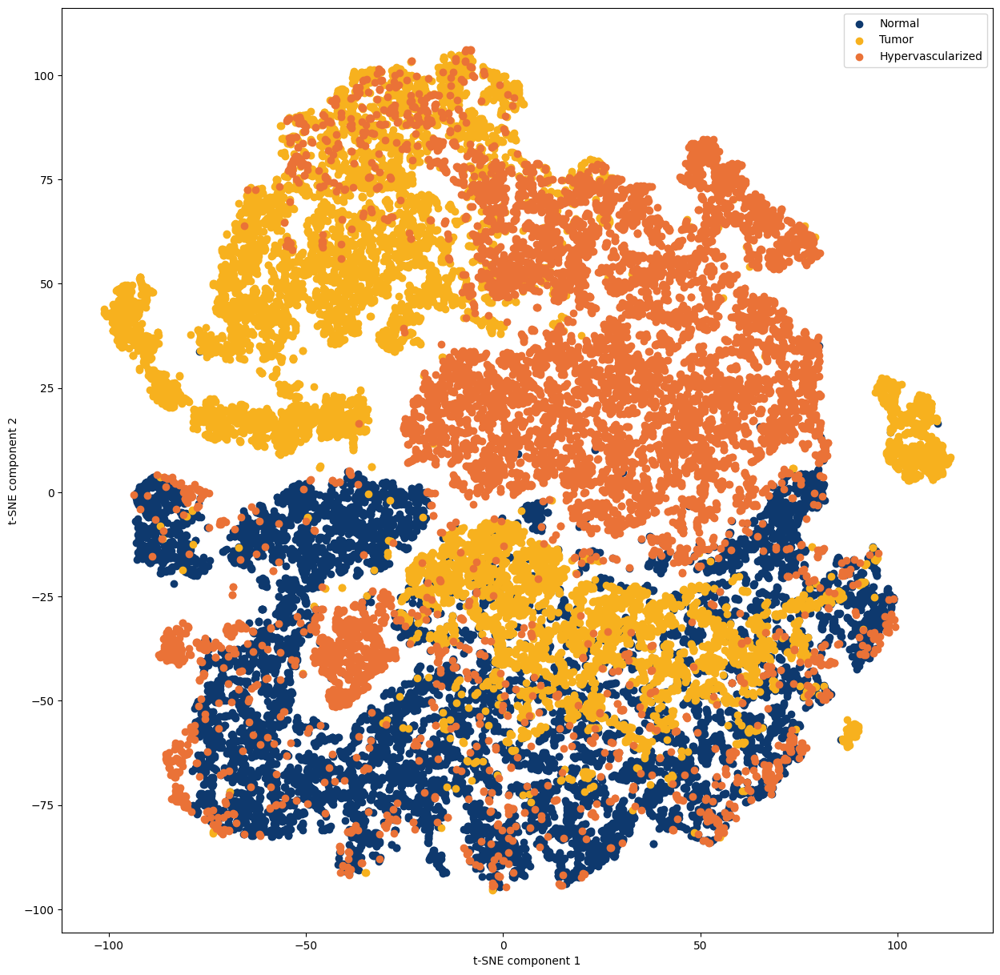

In [21]:
n = M_mc_smooth.shape[1]
l = abs_data.shape[0]
heatmaps = np.zeros((l,n))
for i in range(n):
    endmembers_remove = np.delete(M_mc_smooth, i, axis=1).T
    endmember_target = M_mc_smooth[:,i]
    heatmaps[:,i] = osp(abs_data, endmembers_remove, endmember_target)

plot_tsne(clip_data(heatmaps), gt_data, class_labels, figsize=(15,15), mode="all")

T-SNE of of CEM with MC spectra

(<Figure size 1500x1500 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

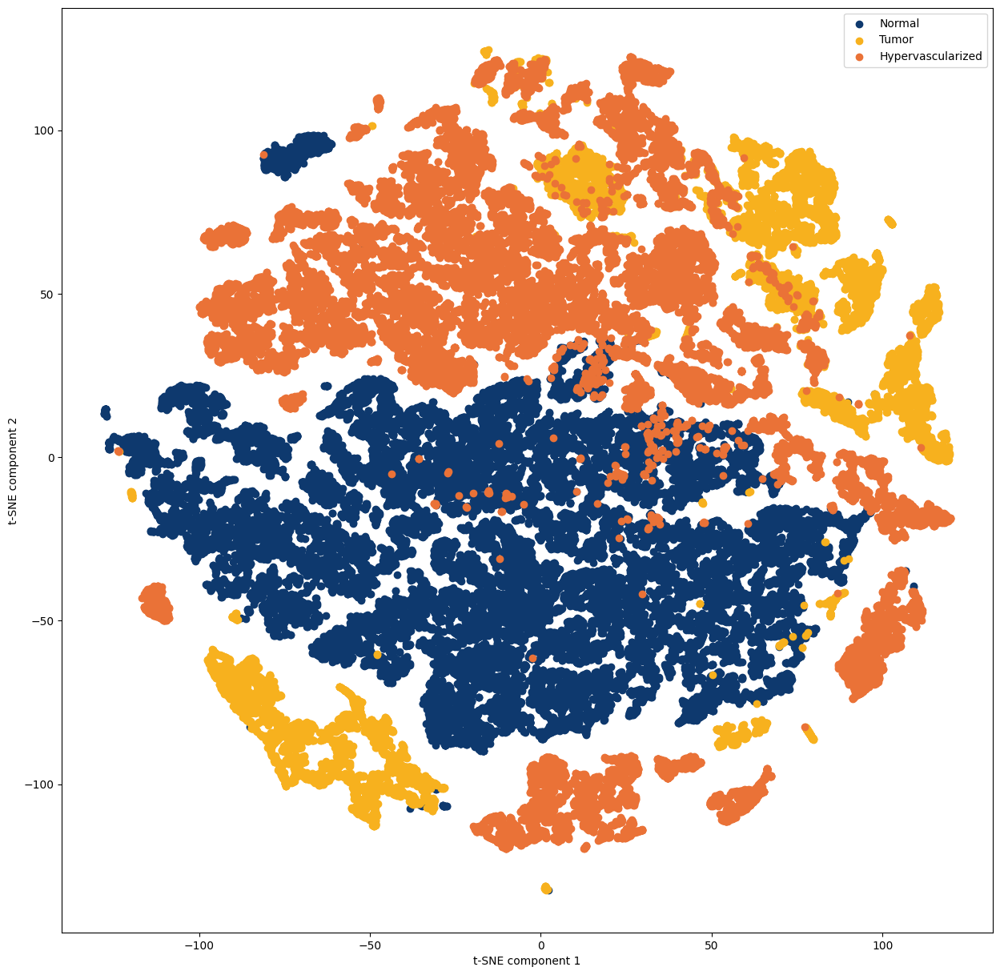

In [32]:
n = M_mc_smooth.shape[1]
l = abs_data.shape[0]
heatmaps = np.zeros((l,n))
for i in range(n):
    endmember_target = M_mc_smooth[:,i]
    heatmaps[:,i] = icem(abs_data, endmember_target, 1)

plot_tsne(clip_data(heatmaps), gt_data, class_labels, figsize=(15,15), mode="all")

T-SNE of of CEM with original spectra

(<Figure size 1500x1500 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

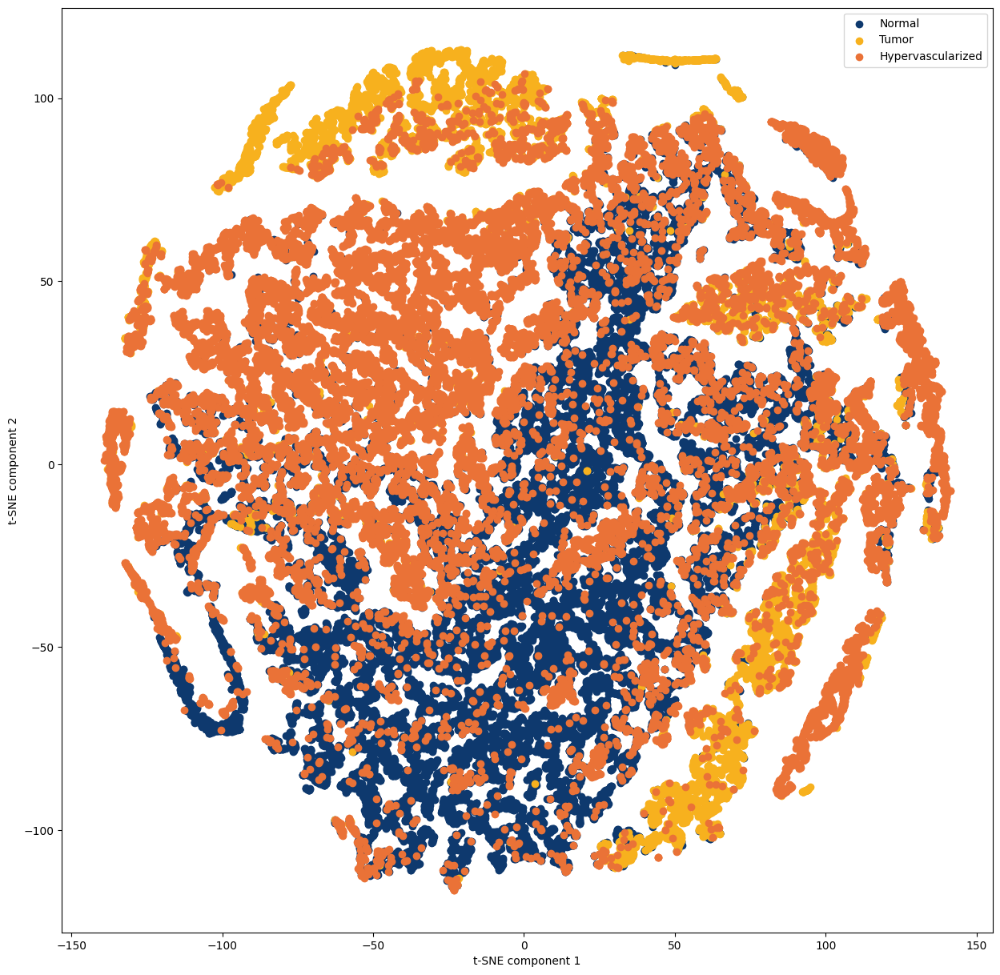

In [33]:
n = M_scatter_orig_smooth.shape[1]
l = abs_data.shape[0]
heatmaps = np.zeros((l,n))
for i in range(n):
    endmember_target = M_scatter_orig_smooth[:,i]
    heatmaps[:,i] = icem(abs_data, endmember_target, 1)

plot_tsne(clip_data(heatmaps), gt_data, class_labels, figsize=(15,15), mode="all")

(<Figure size 1500x1500 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

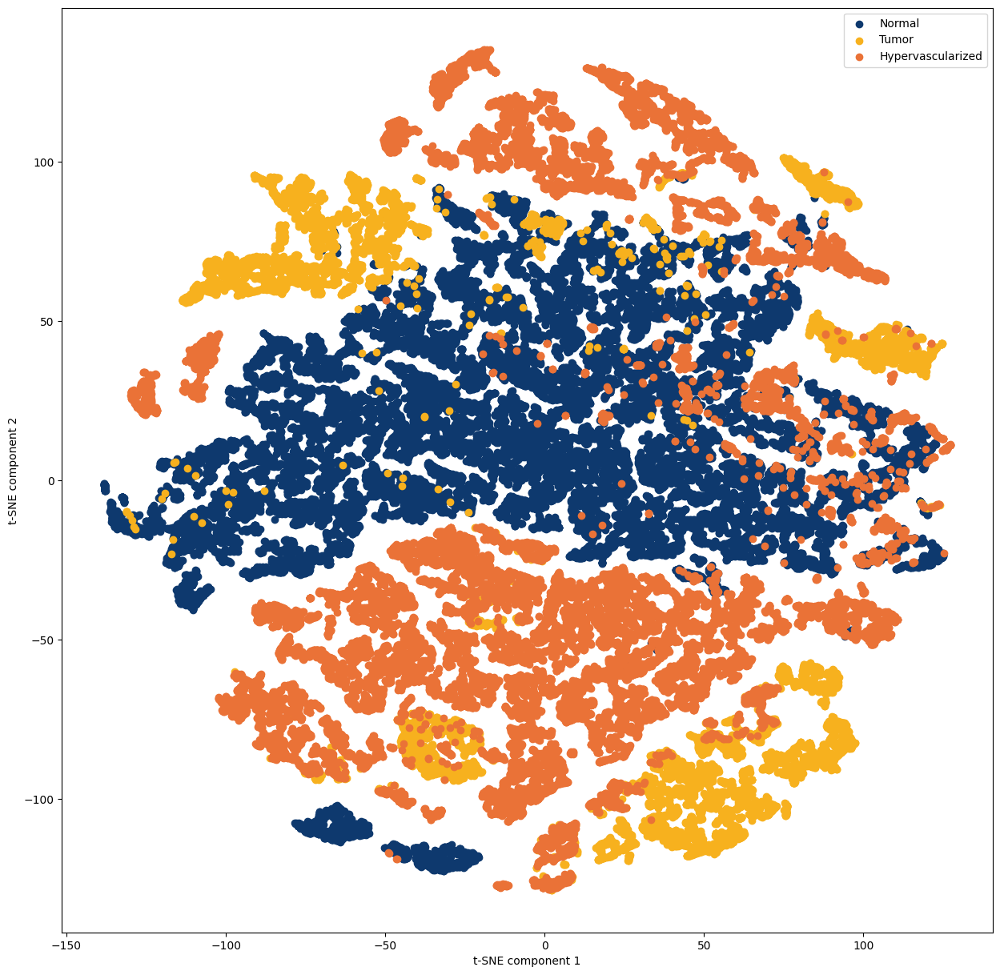

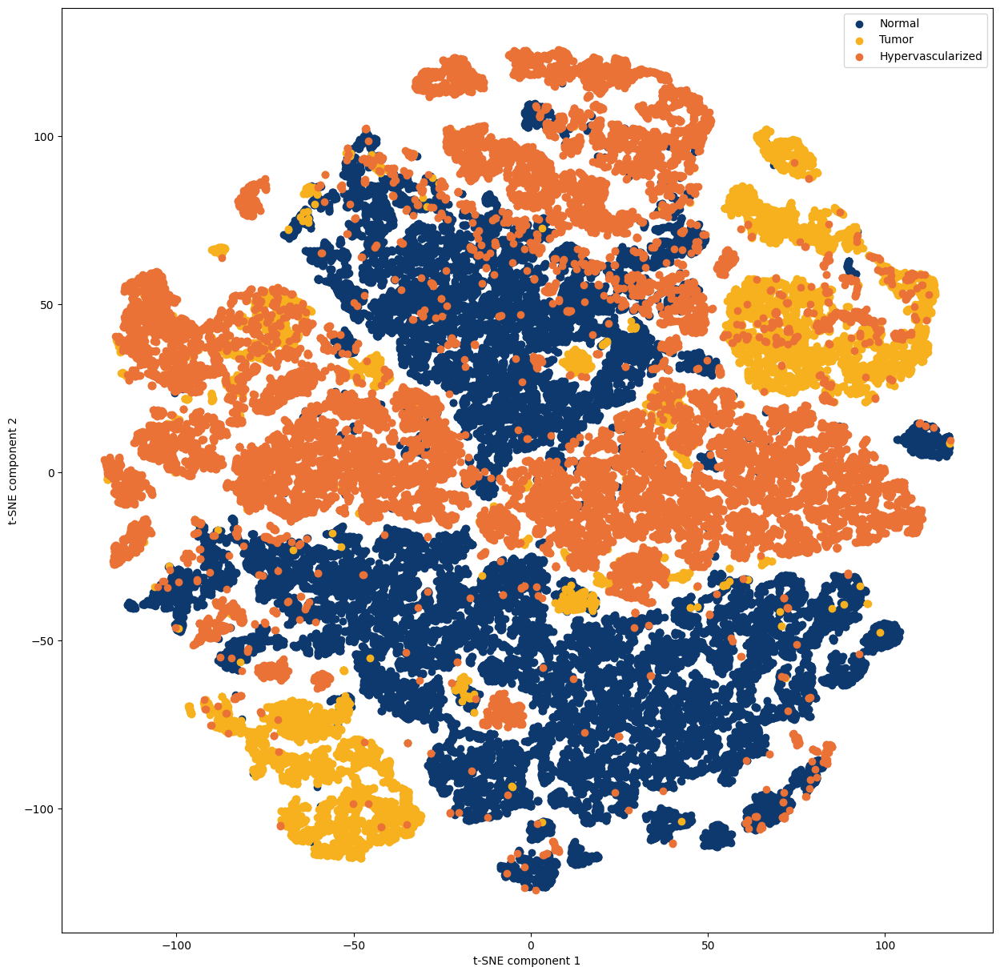

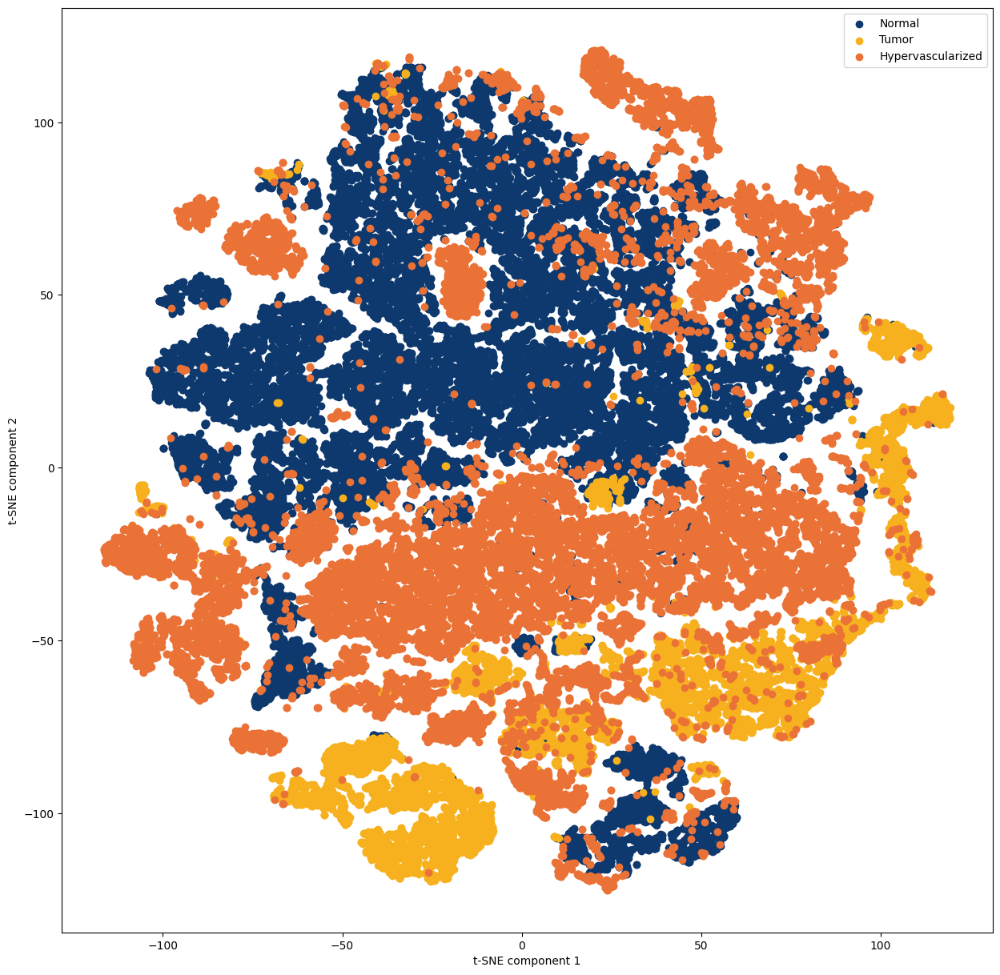

In [18]:
def svd_cem(spectr, endmember, r=5):
    '''
    Improved constrained energy minimization (ICEM) algorithm.
    input:
        spectr: image to unmix, shape (...,k) where k is the number of bands and ... are the spatial or time dimensions
        endmember: endmember to unmix, shape (k,)
        lmda: regularization parameter, float
    output:
        heatmap, np.array
    '''
    input_shape = spectr.shape
    M = spectr.reshape(-1, input_shape[-1])
    t = endmember

    def corr(M):
        p, N = M.shape
        return np.dot(M, M.T) / N

    N, p = M.shape
    R_hat = corr(M.T) #lmda * np.eye(p)

    # approximate R_hat inverse
    U, s, Vh = np.linalg.svd(R_hat, full_matrices=False)
    S_inv = np.diag(1/s)
    Rinv= Vh.T[:,:r] @ S_inv[:r,:r] @ U.T[:r,:]

    denom = np.dot(t.T, np.dot(Rinv, t))
    t_Rinv = np.dot(t.T, Rinv)
    y = np.dot(t_Rinv , M[0:,:].T) / denom

    return y.reshape(input_shape[:-1])

n = M_mc_smooth.shape[1]
l = abs_data.shape[0]
heatmaps = np.zeros((l,n))
for i in range(n):
    endmember_target = M_mc_smooth[:,i]
    heatmaps[:,i] = svd_cem(abs_data, endmember_target, 4)

plot_tsne(clip_data(heatmaps), gt_data, class_labels, figsize=(15,15), mode="all")

n = M_mc_smooth.shape[1]
l = abs_data.shape[0]
heatmaps = np.zeros((l,n))
for i in range(n):
    endmember_target = M_mc_smooth[:,i]
    heatmaps[:,i] = svd_cem(abs_data, endmember_target, 6)

plot_tsne(clip_data(heatmaps), gt_data, class_labels, figsize=(15,15), mode="all")

n = M_mc_smooth.shape[1]
l = abs_data.shape[0]
heatmaps = np.zeros((l,n))
for i in range(n):
    endmember_target = M_mc_smooth[:,i]
    heatmaps[:,i] = svd_cem(abs_data, endmember_target, 7)

plot_tsne(clip_data(heatmaps), gt_data, class_labels, figsize=(15,15), mode="all")

### Combine OSP and CEM

0
1
2
3
4
5
6
7
8
9
10


(<Figure size 1500x1500 with 1 Axes>,
 <Axes: xlabel='t-SNE component 1', ylabel='t-SNE component 2'>)

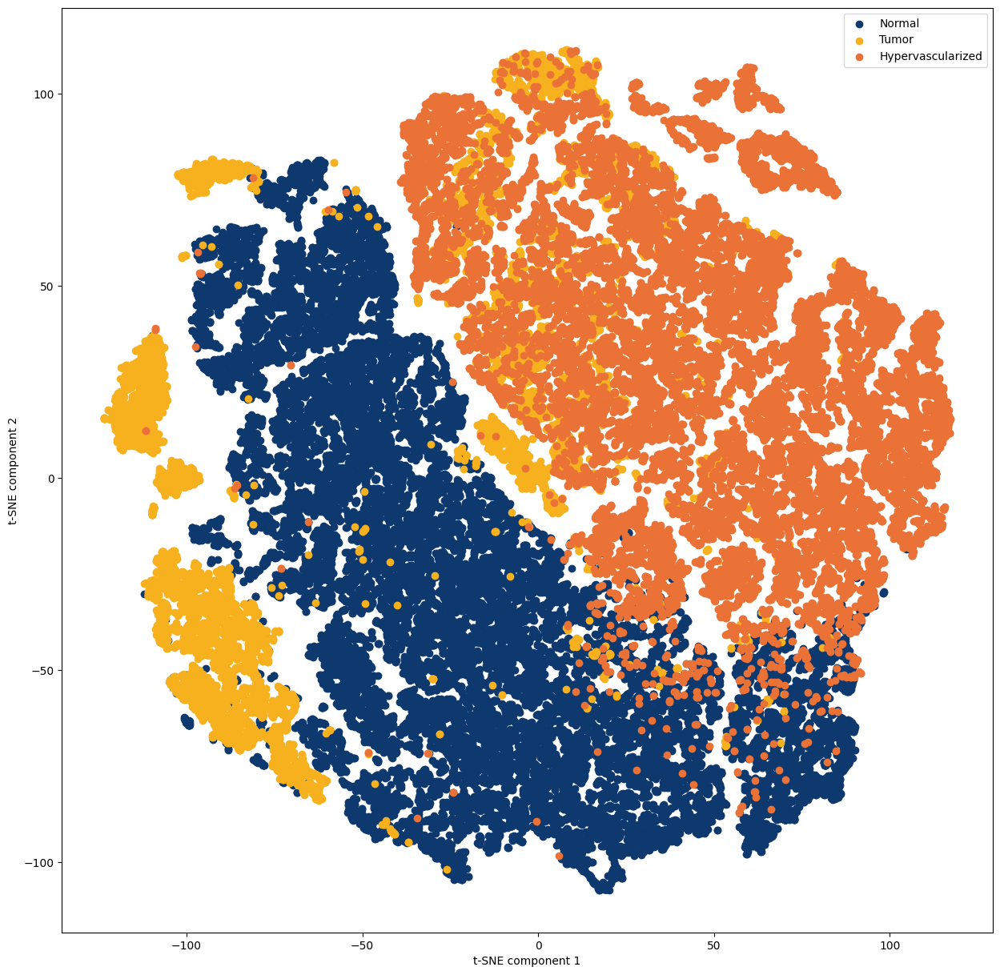

In [23]:
n = M_mc_smooth.shape[1]
l = abs_data.shape[0]
heatmaps = np.zeros((l,3*n))
for i in range(n):
    endmembers_remove = np.delete(M_mc_smooth, i, axis=1).T
    endmember_target = M_mc_smooth[:,i]
    # heatmaps[:,i] = osp(abs_data, endmembers_remove, endmember_target)
    heatmaps[:,i] = icem(abs_data, endmember_target, 1)

    endmembers_remove = np.delete(M_scatter_orig_smooth, i, axis=1).T
    endmember_target = M_scatter_orig_smooth[:,i]
    heatmaps[:,i+n] = osp(abs_data, endmembers_remove, endmember_target)
    heatmaps[:,i+2*n] = icem(abs_data, endmember_target, 1)
    print(i)

plot_tsne(clip_data(heatmaps), gt_data, class_labels, figsize=(15,15), mode="all")